In [1]:
import pandas as pd
import requests
from io import StringIO
import us  # Library to convert state names to abbreviations

def fetch_data_with_pagination(url, limit=1000):
    offset = 0
    data_frames = []

    while True:
        response = requests.get(f"{url}?$limit={limit}&$offset={offset}")
        if response.status_code != 200:
            print(f"Failed to fetch data from the API. Status code: {response.status_code}")
            break

        df = pd.read_csv(StringIO(response.text))
        data_frames.append(df)

        if len(df) < limit:
            break

        offset += limit

    return pd.concat(data_frames, ignore_index=True)

# Define the API endpoints
url_hosp_metrics = 'https://data.cdc.gov/resource/aemt-mg7g.csv'
url_covid_net = 'https://data.cdc.gov/resource/6jg4-xsqq.csv'

# Fetch all data from the API endpoints
hosp_metrics_df = fetch_data_with_pagination(url_hosp_metrics)
covid_net_df = fetch_data_with_pagination(url_covid_net)

print(f"Hospitalization Metrics DataFrame Shape: {hosp_metrics_df.shape}")
print(f"COVID-NET DataFrame Shape: {covid_net_df.shape}")

Hospitalization Metrics DataFrame Shape: (11913, 64)
COVID-NET DataFrame Shape: (149176, 9)


In [2]:
pd.set_option('display.max_row', None)
hosp_metrics_df.dtypes

week_end_date                                                          object
jurisdiction                                                           object
weekly_actual_days_reporting_any_data                                   int64
weekly_percent_days_reporting_any_data                                float64
num_hospitals_previous_day_admission_adult_covid_confirmed              int64
num_hospitals_previous_day_admission_pediatric_covid_confirmed          int64
num_hospitals_previous_day_admission_influenza_confirmed                int64
num_hospitals_total_patients_hospitalized_confirmed_influenza           int64
num_hospitals_icu_patients_confirmed_influenza                          int64
num_hospitals_inpatient_beds                                            int64
num_hospitals_total_icu_beds                                            int64
num_hospitals_inpatient_beds_used                                       int64
num_hospitals_icu_beds_used                                     

In [3]:
columns = [
    'week_end_date',
    'jurisdiction',
    'percent_adult_covid_admissions',
    'percent_pediatric_covid_admissions',
    'percent_hospitals_previous_day_admission_adult_covid_confirmed',
    'percent_hospitals_previous_day_admission_pediatric_covid_confirmed',
    'percent_hospitals_previous_day_admission_influenza_confirmed',
    'percent_hospitals_total_patients_hospitalized_confirmed_influenza',
    'percent_hospitals_icu_patients_confirmed_influenza',
    'percent_hospitals_inpatient_beds',
    'percent_hospitals_total_icu_beds',
    'percent_hospitals_inpatient_beds_used',
    'percent_hospitals_icu_beds_used',
    'percent_hospitals_percent_inpatient_beds_occupied',
    'percent_hospitals_percent_staff_icu_beds_occupied',
    'percent_hospitals_percent_inpatient_beds_covid',
    'percent_hospitals_percent_inpatient_beds_influenza',
    'percent_hospitals_percent_staff_icu_beds_covid',
    'percent_hospitals_percent_icu_beds_influenza',
    'percent_hospitals_admissions_all_covid_confirmed',
    'percent_hospitals_total_patients_hospitalized_covid_confirmed',
    'percent_hospitals_staff_icu_patients_covid_confirmed',
    'avg_total_patients_hospitalized_covid_confirmed',
    'avg_total_patients_hospitalized_influenza_confirmed',
    'avg_staff_icu_patients_covid_confirmed',
    'avg_icu_patients_influenza_confirmed',
    'avg_inpatient_beds',
    'avg_total_icu_beds',
    'avg_inpatient_beds_used',
    'avg_icu_beds_used',
    'avg_percent_inpatient_beds_occupied',
    'avg_percent_staff_icu_beds_occupied',
    'avg_percent_inpatient_beds_covid',
    'avg_percent_inpatient_beds_influenza',
    'avg_percent_staff_icu_beds_covid',
    'avg_percent_icu_beds_influenza',
    'total_admissions_all_influenza_confirmed',
    'total_admissions_all_covid_confirmed',
    'total_admissions_pediatric_covid_confirmed',
    'total_admissions_adult_covid_confirmed'
]

# Filter the DataFrame to retain only the specified columns
hosp_metrics_df = hosp_metrics_df[columns]

In [4]:
# Dictionary mapping state names and abbreviations to their latitude and longitude
state_latlong = {
    'AL': (32.318230, -86.902298), 'Alabama': (32.318230, -86.902298),
    'AK': (66.160507, -153.369141), 'Alaska': (66.160507, -153.369141),
    'AZ': (34.048927, -111.093735), 'Arizona': (34.048927, -111.093735),
    'AR': (34.799999, -92.199997), 'Arkansas': (34.799999, -92.199997),
    'CA': (36.778259, -119.417931), 'California': (36.778259, -119.417931),
    'CO': (39.113014, -105.358887), 'Colorado': (39.113014, -105.358887),
    'CT': (41.599998, -72.699997), 'Connecticut': (41.599998, -72.699997),
    'DE': (39.000000, -75.500000), 'Delaware': (39.000000, -75.500000),
    'FL': (27.994402, -81.760254), 'Florida': (27.994402, -81.760254),
    'GA': (33.247875, -83.441162), 'Georgia': (33.247875, -83.441162),
    'HI': (19.741755, -155.844437), 'Hawaii': (19.741755, -155.844437),
    'ID': (44.068203, -114.742043), 'Idaho': (44.068203, -114.742043),
    'IL': (40.000000, -89.000000), 'Illinois': (40.000000, -89.000000),
    'IN': (40.273502, -86.126976), 'Indiana': (40.273502, -86.126976),
    'IA': (42.032974, -93.581543), 'Iowa': (42.032974, -93.581543),
    'KS': (38.500000, -98.000000), 'Kansas': (38.500000, -98.000000),
    'KY': (37.839333, -84.270020), 'Kentucky': (37.839333, -84.270020),
    'LA': (30.391830, -92.329102), 'Louisiana': (30.391830, -92.329102),
    'ME': (45.367584, -68.972168), 'Maine': (45.367584, -68.972168),
    'MD': (39.045753, -76.641273), 'Maryland': (39.045753, -76.641273),
    'MA': (42.407211, -71.382439), 'Massachusetts': (42.407211, -71.382439),
    'MI': (44.182205, -84.506836), 'Michigan': (44.182205, -84.506836),
    'MN': (46.392410, -94.636230), 'Minnesota': (46.392410, -94.636230),
    'MS': (33.000000, -90.000000), 'Mississippi': (33.000000, -90.000000),
    'MO': (38.573936, -92.603760), 'Missouri': (38.573936, -92.603760),
    'MT': (46.965260, -109.533691), 'Montana': (46.965260, -109.533691),
    'NE': (41.500000, -100.000000), 'Nebraska': (41.500000, -100.000000),
    'NV': (39.876019, -117.224121), 'Nevada': (39.876019, -117.224121),
    'NH': (44.000000, -71.500000), 'New Hampshire': (44.000000, -71.500000),
    'NJ': (39.833851, -74.871826), 'New Jersey': (39.833851, -74.871826),
    'NM': (34.307144, -106.018066), 'New Mexico': (34.307144, -106.018066),
    'NY': (43.000000, -75.000000), 'New York': (43.000000, -75.000000),
    'NC': (35.782169, -80.793457), 'North Carolina': (35.782169, -80.793457),
    'ND': (47.650589, -100.437012), 'North Dakota': (47.650589, -100.437012),
    'OH': (40.367474, -82.996216), 'Ohio': (40.367474, -82.996216),
    'OK': (36.084621, -96.921387), 'Oklahoma': (36.084621, -96.921387),
    'OR': (44.000000, -120.500000), 'Oregon': (44.000000, -120.500000),
    'PA': (41.203323, -77.194527), 'Pennsylvania': (41.203323, -77.194527),
    'RI': (41.742325, -71.742332), 'Rhode Island': (41.742325, -71.742332),
    'SC': (33.836082, -81.163727), 'South Carolina': (33.836082, -81.163727),
    'SD': (44.500000, -100.000000), 'South Dakota': (44.500000, -100.000000),
    'TN': (35.860119, -86.660156), 'Tennessee': (35.860119, -86.660156),
    'TX': (31.000000, -100.000000), 'Texas': (31.000000, -100.000000),
    'UT': (39.419220, -111.950684), 'Utah': (39.419220, -111.950684),
    'VT': (44.000000, -72.699997), 'Vermont': (44.000000, -72.699997),
    'VA': (37.926868, -78.024902), 'Virginia': (37.926868, -78.024902),
    'WA': (47.751076, -120.740135), 'Washington': (47.751076, -120.740135),
    'WV': (39.000000, -80.500000), 'West Virginia': (39.000000, -80.500000),
    'WI': (44.500000, -89.500000), 'Wisconsin': (44.500000, -89.500000),
    'WY': (43.075970, -107.290283), 'Wyoming': (43.075970, -107.290283)
}

In [18]:
# Apply the mapping to create new columns for latitude and longitude
def get_lat_long(state_name):
    return state_latlong.get(state_name, (None, None))
hosp_metrics_df[['latitude', 'longitude']] = hosp_metrics_df['jurisdiction'].apply(lambda x: pd.Series(get_lat_long(x)))
covid_net_df[['latitude', 'longitude']] = covid_net_df['state'].apply(lambda x: pd.Series(get_lat_long(x)))

In [6]:
# Convert 'week_end_date' to datetime
hosp_metrics_df['week_end_date'] = pd.to_datetime(hosp_metrics_df['week_end_date'])

# Extract year, month, and day into separate columns
hosp_metrics_df['year'] = hosp_metrics_df['week_end_date'].dt.year
hosp_metrics_df['month'] = hosp_metrics_df['week_end_date'].dt.month
hosp_metrics_df['day'] = hosp_metrics_df['week_end_date'].dt.day

In [7]:
# Remove rows where any column has an exact value of 0.0 or is NaN
hosp_metrics_df = hosp_metrics_df[(hosp_metrics_df != 0.0).all(axis=1)]
hosp_metrics_df = hosp_metrics_df.dropna()

In [8]:
pd.set_option('display.max_row', None)
hosp_metrics_df = hosp_metrics_df.sort_values(by=['week_end_date'])
hosp_metrics_df

,week_end_date,jurisdiction,percent_adult_covid_admissions,percent_pediatric_covid_admissions,percent_hospitals_previous_day_admission_adult_covid_confirmed,percent_hospitals_previous_day_admission_pediatric_covid_confirmed,percent_hospitals_previous_day_admission_influenza_confirmed,percent_hospitals_total_patients_hospitalized_confirmed_influenza,percent_hospitals_icu_patients_confirmed_influenza,percent_hospitals_inpatient_beds,...,avg_percent_icu_beds_influenza,total_admissions_all_influenza_confirmed,total_admissions_all_covid_confirmed,total_admissions_pediatric_covid_confirmed,total_admissions_adult_covid_confirmed,latitude,longitude,year,month,day
5444,2020-10-17,TX,0.9799,0.0201,0.9458,0.9458,0.9052,0.9052,0.9052,0.9458,...,0.0008,6.0,4629.0,93.0,4536.0,31.000000,-100.000000,2020,10,17
1056,2020-10-24,PA,0.9832,0.0168,0.9368,0.8793,0.5575,0.5690,0.5517,0.9080,...,0.0006,5.0,1010.0,17.0,993.0,41.203323,-77.194527,2020,10,24
2937,2020-10-24,MO,0.9940,0.0060,1.0000,1.0000,0.7611,0.7611,0.7611,1.0000,...,0.0016,8.0,1169.0,7.0,1162.0,38.573936,-92.603760,2020,10,24
2101,2020-10-24,MI,0.9955,0.0045,0.9857,0.9857,0.7857,0.7857,0.7857,0.9857,...,0.0005,7.0,892.0,4.0,888.0,44.182205,-84.506836,2020,10,24
10043,2020-10-24,FL,0.9737,0.0263,0.9524,0.9524,0.3619,0.3619,0.3619,0.9524,...,0.0016,21.0,2242.0,59.0,2183.0,27.994402,-81.760254,2020,10,24
5654,2020-10-24,CA,0.9878,0.0122,0.9829,0.9771,0.9000,0.9000,0.9000,0.9829,...,0.0010,9.0,2053.0,25.0,2028.0,36.778259,-119.417931,2020,10,24
8580,2020-10-24,TN,0.9940,0.0060,0.9813,0.9813,0.9813,0.9813,0.9813,0.9813,...,0.0005,19.0,1160.0,7.0,1153.0,35.860119,-86.660156,2020,10,24
10670,2020-10-24,GA,0.9899,0.0101,0.9859,0.9789,0.8662,0.8662,0.8662,0.9577,...,0.0006,4.0,1788.0,18.0,1770.0,33.247875,-83.441162,2020,10,24
2728,2020-10-24,IL,0.9917,0.0083,0.9834,0.9392,0.6796,0.6796,0.6796,0.9613,...,0.0008,1.0,2036.0,17.0,2019.0,40.000000,-89.000000,2020,10,24
5445,2020-10-24,TX,0.9828,0.0172,0.9458,0.9458,0.9368,0.9368,0.9368,0.9458,...,0.0012,45.0,5117.0,88.0,5029.0,31.000000,-100.000000,2020,10,24


In [9]:
covid_net_df.dtypes

state                  object
season                 object
_weekenddate           object
agecategory_legend     object
sex_label              object
race_label             object
type                   object
weeklyrate            float64
cumulativerate        float64
dtype: object

In [11]:
# Convert 'week_end_date' to datetime
covid_net_df['_weekenddate'] = pd.to_datetime(covid_net_df['_weekenddate'])

# Extract year, month, and day into separate columns
covid_net_df['year'] = covid_net_df['_weekenddate'].dt.year
covid_net_df['month'] = covid_net_df['_weekenddate'].dt.month
covid_net_df['day'] = covid_net_df['_weekenddate'].dt.day

In [12]:
# Remove rows where any column is NaN
covid_net_df = covid_net_df.dropna()

# Remove rows where 'agecategory_legend', 'sex_label', or 'race_label' are not 'All'
covid_net_df = covid_net_df[
    (covid_net_df['agecategory_legend'] == 'All') & 
    (covid_net_df['sex_label'] == 'All') & 
    (covid_net_df['race_label'] == 'All')
]

In [13]:
covid_net_df

,state,season,_weekenddate,agecategory_legend,sex_label,race_label,type,weeklyrate,cumulativerate,latitude,longitude,year,month,day
0,Utah,2021-22,2022-10-01,All,All,All,Crude Rate,4.1,445.8,39.419220,-111.950684,2022,10,1
1,Utah,2021-22,2022-09-24,All,All,All,Crude Rate,3.1,441.7,39.419220,-111.950684,2022,9,24
2,Utah,2021-22,2022-09-17,All,All,All,Crude Rate,4.6,438.6,39.419220,-111.950684,2022,9,17
3,Utah,2021-22,2022-09-10,All,All,All,Crude Rate,3.9,434.0,39.419220,-111.950684,2022,9,10
4,Utah,2021-22,2022-09-03,All,All,All,Crude Rate,3.8,430.1,39.419220,-111.950684,2022,9,3
5,Utah,2021-22,2022-08-27,All,All,All,Crude Rate,4.6,426.3,39.419220,-111.950684,2022,8,27
6,Utah,2021-22,2022-08-20,All,All,All,Crude Rate,4.6,421.7,39.419220,-111.950684,2022,8,20
7,Utah,2021-22,2022-08-13,All,All,All,Crude Rate,6.4,417.0,39.419220,-111.950684,2022,8,13
8,Utah,2021-22,2022-08-06,All,All,All,Crude Rate,6.5,410.6,39.419220,-111.950684,2022,8,6
9,Utah,2021-22,2022-07-30,All,All,All,Crude Rate,7.8,404.1,39.419220,-111.950684,2022,7,30


In [14]:
covid_net_df.to_csv('covid_net_df.csv')
hosp_metrics_df.to_csv('hosp_metrics_df.csv')

In [15]:
# Sort the DataFrames by 'week_end_date' and geographical coordinates
hosp_metrics_df = hosp_metrics_df.sort_values(['week_end_date', 'longitude', 'latitude'])
covid_net_df = covid_net_df.sort_values(['_weekenddate', 'longitude', 'latitude'])

# Perform the merge with a 7-day tolerance
df = pd.merge_asof(
    hosp_metrics_df,
    covid_net_df[['_weekenddate','longitude', 'latitude','weeklyrate']],
    left_on='week_end_date',
    right_on='_weekenddate',
    by=['longitude', 'latitude'],
    tolerance=pd.Timedelta('14D'),
    direction='nearest'
)

df = df.dropna()
df = df.drop(columns=['week_end_date', '_weekenddate'])
df.dtypes

jurisdiction                                                           object
percent_adult_covid_admissions                                        float64
percent_pediatric_covid_admissions                                    float64
percent_hospitals_previous_day_admission_adult_covid_confirmed        float64
percent_hospitals_previous_day_admission_pediatric_covid_confirmed    float64
percent_hospitals_previous_day_admission_influenza_confirmed          float64
percent_hospitals_total_patients_hospitalized_confirmed_influenza     float64
percent_hospitals_icu_patients_confirmed_influenza                    float64
percent_hospitals_inpatient_beds                                      float64
percent_hospitals_total_icu_beds                                      float64
percent_hospitals_inpatient_beds_used                                 float64
percent_hospitals_icu_beds_used                                       float64
percent_hospitals_percent_inpatient_beds_occupied               

In [66]:
from sklearn.model_selection import train_test_split

# Define the features and target variable
features = [
    'percent_adult_covid_admissions', 'percent_pediatric_covid_admissions',
    'percent_hospitals_previous_day_admission_adult_covid_confirmed',
    'percent_hospitals_previous_day_admission_pediatric_covid_confirmed',
    'percent_hospitals_previous_day_admission_influenza_confirmed',
    'percent_hospitals_total_patients_hospitalized_confirmed_influenza',
    'percent_hospitals_icu_patients_confirmed_influenza',
    'percent_hospitals_inpatient_beds', 'percent_hospitals_total_icu_beds',
    'percent_hospitals_inpatient_beds_used', 'percent_hospitals_icu_beds_used',
    'percent_hospitals_percent_inpatient_beds_occupied',
    'percent_hospitals_percent_staff_icu_beds_occupied',
    'percent_hospitals_percent_inpatient_beds_covid',
    'percent_hospitals_percent_inpatient_beds_influenza',
    'percent_hospitals_percent_staff_icu_beds_covid',
    'percent_hospitals_percent_icu_beds_influenza',
    'percent_hospitals_admissions_all_covid_confirmed',
    'percent_hospitals_total_patients_hospitalized_covid_confirmed',
    'percent_hospitals_staff_icu_patients_covid_confirmed',
    'avg_total_patients_hospitalized_covid_confirmed',
    'avg_total_patients_hospitalized_influenza_confirmed',
    'avg_staff_icu_patients_covid_confirmed', 'avg_icu_patients_influenza_confirmed',
    'avg_inpatient_beds', 'avg_total_icu_beds', 'avg_inpatient_beds_used',
    'avg_icu_beds_used', 'avg_percent_inpatient_beds_occupied',
    'avg_percent_staff_icu_beds_occupied', 'avg_percent_inpatient_beds_covid',
    'avg_percent_inpatient_beds_influenza', 'avg_percent_staff_icu_beds_covid',
    'avg_percent_icu_beds_influenza', 'total_admissions_all_influenza_confirmed',
    'total_admissions_all_covid_confirmed', 'total_admissions_pediatric_covid_confirmed',
    'total_admissions_adult_covid_confirmed', 'latitude', 'longitude',
    'year', 'month', 'day'
]
target = 'weeklyrate'

X = df[features]
y = df[target]

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Save the split datasets to CSV files
X_train.to_csv('X_train.csv', index=False)
X_test.to_csv('X_test.csv', index=False)
y_train.to_csv('y_train.csv', index=False)
y_test.to_csv('y_test.csv', index=False)

In [69]:
from sklearn.model_selection import GridSearchCV, cross_val_score
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler
import joblib
from xgboost import XGBRegressor
from sklearn.ensemble import RandomForestRegressor

# Load the training data
X_train = pd.read_csv('X_train.csv')
y_train = pd.read_csv('y_train.csv')

y_train = y_train.squeeze()

# Normalize the data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)

# Hyperparameter tuning for XGBoost
param_grid_xgb = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 6, 10],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0]
}

grid_search_xgb = GridSearchCV(estimator=XGBRegressor(random_state=42),
                               param_grid=param_grid_xgb,
                               cv=5,
                               n_jobs=-1,
                               scoring='neg_mean_squared_error',
                               verbose=1)
grid_search_xgb.fit(X_train_scaled, y_train.values.ravel())

best_model_xgb = grid_search_xgb.best_estimator_
print("XGBoost Best Parameters:", grid_search_xgb.best_params_)

# Evaluate with Cross-Validation
cv_scores_xgb = cross_val_score(best_model_xgb, X_train_scaled, y_train.values.ravel(), cv=5, scoring='neg_mean_squared_error')
print(f'XGBoost Cross-Validation MSE: {-cv_scores_xgb.mean()}')

# Hyperparameter tuning for RandomForestRegressor
param_grid_rf = {
    'n_estimators': [50, 100, 200],
    'max_features': ['sqrt', 'log2', None],
    'max_depth': [10, 20, 30, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

grid_search_rf = GridSearchCV(estimator=RandomForestRegressor(random_state=42),
                              param_grid=param_grid_rf,
                              cv=5,
                              n_jobs=-1,
                              scoring='neg_mean_squared_error',
                              verbose=1)
grid_search_rf.fit(X_train_scaled, y_train.values.ravel())

best_model_rf = grid_search_rf.best_estimator_
print("Random Forest Best Parameters:", grid_search_rf.best_params_)

# Evaluate with Cross-Validation
cv_scores_rf = cross_val_score(best_model_rf, X_train_scaled, y_train.values.ravel(), cv=5, scoring='neg_mean_squared_error')
print(f'Random Forest Cross-Validation MSE: {-cv_scores_rf.mean()}')

# Save the trained models
joblib.dump(best_model_xgb, 'covid_rate_predictor_xgb_model.pkl')
joblib.dump(best_model_rf, 'covid_rate_predictor_rf_model.pkl')
joblib.dump(scaler, 'scaler.pkl')

# Evaluate the XGBoost model on the training set
y_train_pred_xgb = best_model_xgb.predict(X_train_scaled)
mae_xgb = mean_absolute_error(y_train, y_train_pred_xgb)
mse_xgb = mean_squared_error(y_train, y_train_pred_xgb)
r2_xgb = r2_score(y_train, y_train_pred_xgb)
print(f'XGBoost Training MAE: {mae_xgb}')
print(f'XGBoost Training MSE: {mse_xgb}')
print(f'XGBoost Training R^2: {r2_xgb * 100:.2f}%')

results_df_xgb = pd.DataFrame({
    'Actual': y_train.values,
    'Predicted_XGB': y_train_pred_xgb,
})

# Evaluate the Random Forest model on the training set
y_train_pred_rf = best_model_rf.predict(X_train_scaled)
mae_rf = mean_absolute_error(y_train, y_train_pred_rf)
mse_rf = mean_squared_error(y_train, y_train_pred_rf)
r2_rf = r2_score(y_train, y_train_pred_rf)
print(f'Random Forest Training MAE: {mae_rf}')
print(f'Random Forest Training MSE: {mse_rf}')
print(f'Random Forest Training R^2: {r2_rf * 100:.2f}%')

results_df_rf = pd.DataFrame({
    'Actual': y_train.values,
    'Predicted_RF': y_train_pred_rf,
})

# Display the first few rows of the results for XGBoost and Random Forestprint("XGBoost Predictions with Confidence Percentage:")
print(results_df_xgb.head())

print("Random Forest Predictions with Confidence Percentage:")
print(results_df_rf.head())

# Save the results with confidence percentages
results_df_xgb.to_csv('train_results_xgb_with_confidence.csv', index=False)
results_df_rf.to_csv('train_results_rf_with_confidence.csv', index=False)

Fitting 5 folds for each of 1 candidates, totalling 5 fits
XGBoost Best Parameters: {'colsample_bytree': 1.0, 'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 200, 'subsample': 1.0}
XGBoost Cross-Validation MSE: 8.259541705297206
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Random Forest Best Parameters: {'max_depth': 30, 'max_features': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 50}
Random Forest Cross-Validation MSE: 10.308987737934862
XGBoost Training MAE: 0.6067707534718443
XGBoost Training MSE: 0.6925333369588987
XGBoost Training R^2: 98.72%
Random Forest Training MAE: 0.65118479880775
Random Forest Training MSE: 1.4319335827123725
Random Forest Training R^2: 97.35%
   Actual  Predicted_XGB
0     3.0       3.013182
1     3.3       3.620350
2     2.4       2.227468
3     4.6       4.072457
4     9.5       7.345407
Random Forest Predictions with Confidence Percentage:
   Actual  Predicted_RF
0     3.0         2.898
1     3.3         4.408

In [70]:
# Load the test data
X_test = pd.read_csv('X_test.csv')
y_test = pd.read_csv('y_test.csv')

y_test = y_test.squeeze()

# Load the trained models and scaler
xgb_model = joblib.load('covid_rate_predictor_xgb_model.pkl')
rf_model = joblib.load('covid_rate_predictor_rf_model.pkl')
scaler = joblib.load('scaler.pkl')

# Normalize the test data
X_test_scaled = scaler.transform(X_test)

In [71]:
# XGBoost model predictions on the test set
y_test_pred_xgb = xgb_model.predict(X_test_scaled)
mae_xgb_test = mean_absolute_error(y_test, y_test_pred_xgb)
mse_xgb_test = mean_squared_error(y_test, y_test_pred_xgb)
r2_xgb_test = r2_score(y_test, y_test_pred_xgb)

print(f'XGBoost Test MAE: {mae_xgb_test}')
print(f'XGBoost Test MSE: {mse_xgb_test}')
print(f'XGBoost Test R^2: {r2_xgb_test * 100:.2f}%')

results_df_xgb_test = pd.DataFrame({
    'Actual': y_test.values,
    'Predicted_XGB': y_test_pred_xgb,
})

# Random Forest model predictions on the test set
y_test_pred_rf = rf_model.predict(X_test_scaled)
mae_rf_test = mean_absolute_error(y_test, y_test_pred_rf)
mse_rf_test = mean_squared_error(y_test, y_test_pred_rf)
r2_rf_test = r2_score(y_test, y_test_pred_rf)

print(f'Random Forest Test MAE: {mae_rf_test}')
print(f'Random Forest Test MSE: {mse_rf_test}')
print(f'Random Forest Test R^2: {r2_rf_test * 100:.2f}%')

results_df_rf_test = pd.DataFrame({
    'Actual': y_test.values,
    'Predicted_RF': y_test_pred_rf,
})

# Display the first few rows of the test results for XGBoost and Random Forestprint("XGBoost Test Predictions with Confidence Percentage:")
print(results_df_xgb_test.head())

print("Random Forest Test Predictions with Confidence Percentage:")
print(results_df_rf_test.head())

XGBoost Test MAE: 1.733081612492069
XGBoost Test MSE: 8.59587266467397
XGBoost Test R^2: 85.41%
Random Forest Test MAE: 1.9369404761904765
Random Forest Test MSE: 11.514066047619048
Random Forest Test R^2: 80.46%
   Actual  Predicted_XGB
0     0.2       0.868163
1     2.6       3.837996
2     3.1       4.887214
3    26.3      21.333485
4     3.3       3.223969
Random Forest Test Predictions with Confidence Percentage:
   Actual  Predicted_RF
0     0.2         0.894
1     2.6         3.150
2     3.1         4.280
3    26.3        21.646
4     3.3         3.708


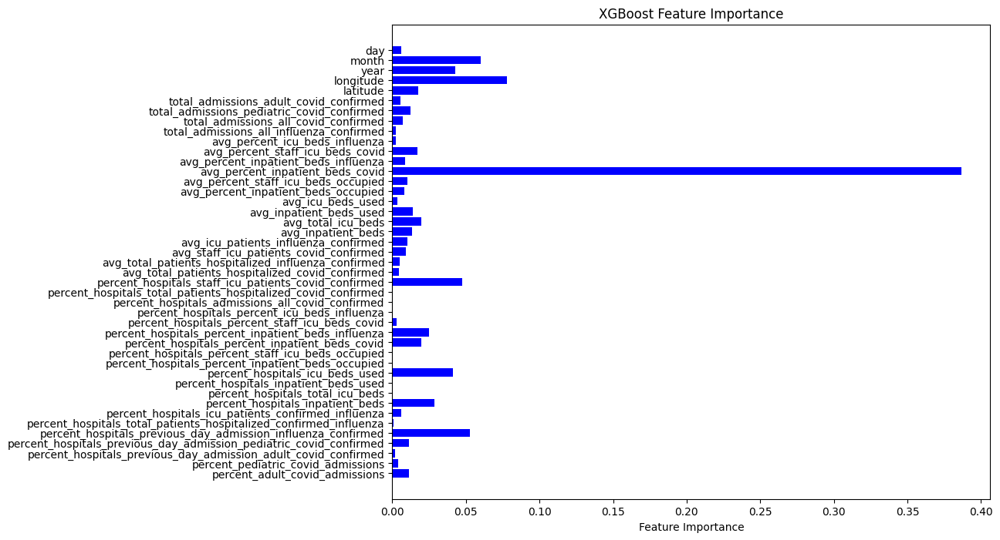

In [72]:
import matplotlib.pyplot as plt

# Get feature importance from the XGBoost model
xgb_importance = xgb_model.feature_importances_

# Assuming you have a list of feature names
feature_names = X_train.columns

# Plotting feature importance
plt.figure(figsize=(10, 8))
plt.barh(feature_names, xgb_importance, color='blue')
plt.xlabel('Feature Importance')
plt.title('XGBoost Feature Importance')
plt.show()

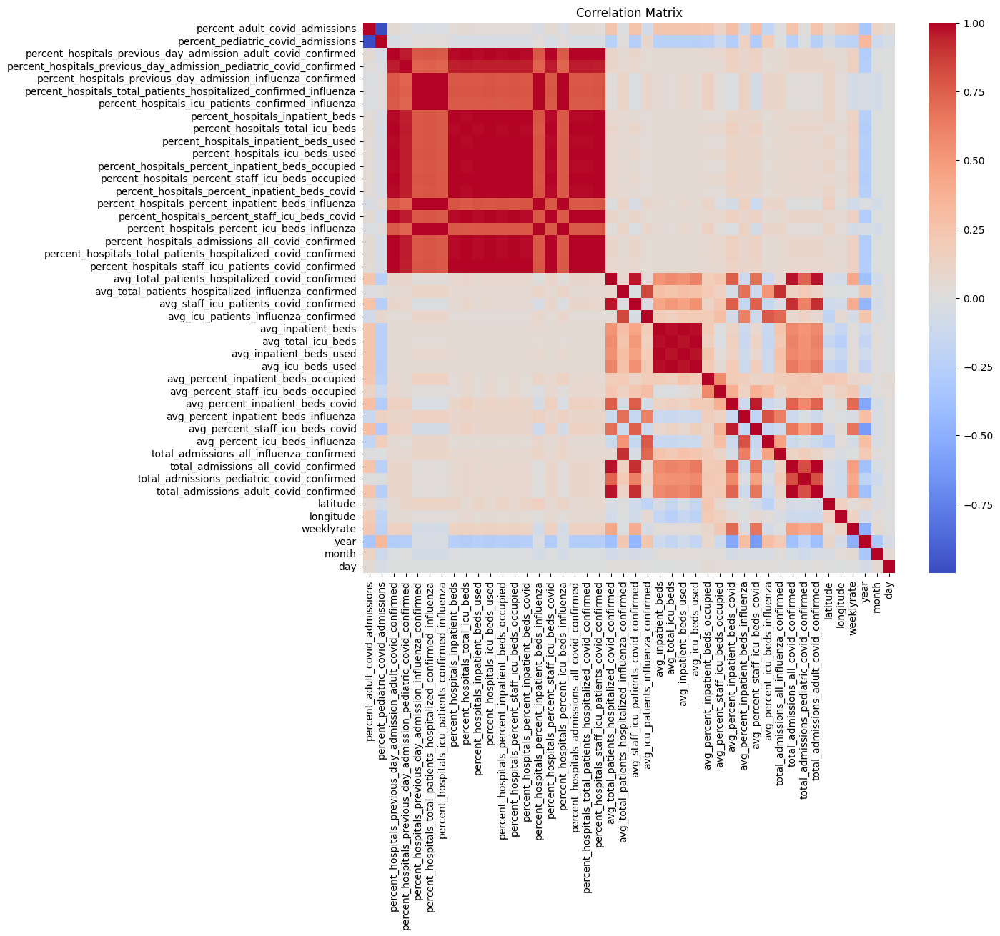

weeklyrate                                                            1.000000
avg_percent_inpatient_beds_covid                                      0.714561
avg_percent_staff_icu_beds_covid                                      0.670827
total_admissions_all_covid_confirmed                                  0.473973
total_admissions_adult_covid_confirmed                                0.473149
avg_total_patients_hospitalized_covid_confirmed                       0.427267
total_admissions_pediatric_covid_confirmed                            0.410528
avg_staff_icu_patients_covid_confirmed                                0.392444
percent_adult_covid_admissions                                        0.225206
avg_percent_staff_icu_beds_occupied                                   0.224180
percent_hospitals_previous_day_admission_pediatric_covid_confirmed    0.153791
percent_hospitals_total_icu_beds                                      0.147423
percent_hospitals_percent_staff_icu_beds_covid      

In [73]:
import matplotlib.pyplot as plt
import seaborn as sns
# Calculate correlation matrix
df1 = df.drop(columns='jurisdiction')
corr_matrix = df1.corr()

# Visualize correlation matrix
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=False, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

# Print the correlation of each feature with the target variable
print(corr_matrix['weeklyrate'].sort_values(ascending=False))

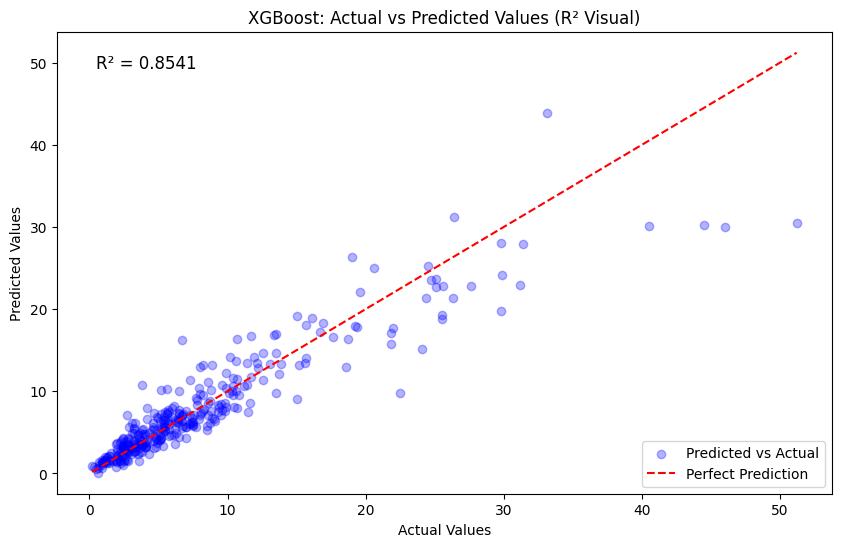

In [81]:
# Plot for XGBoost
plt.figure(figsize=(10, 6))
plt.scatter(results_df_xgb_test['Actual'], results_df_xgb_test['Predicted_XGB'], color='blue', alpha=0.3, label='Predicted vs Actual')

# Add a line representing perfect prediction
perfect_line = np.linspace(min(results_df_xgb_test['Actual']), max(results_df_xgb_test['Actual']), 100)
plt.plot(perfect_line, perfect_line, color='red', linestyle='--', label='Perfect Prediction')

# Add labels and title
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('XGBoost: Actual vs Predicted Values (R² Visual)')
plt.legend()

# Calculate and display the R-squared value on the plot
r2 = r2_score(results_df_xgb_test['Actual'], results_df_xgb_test['Predicted_XGB'])
plt.text(0.05, 0.95, f'R² = {r2:.4f}', transform=plt.gca().transAxes, fontsize=12, verticalalignment='top')

# Show the plot
plt.show()


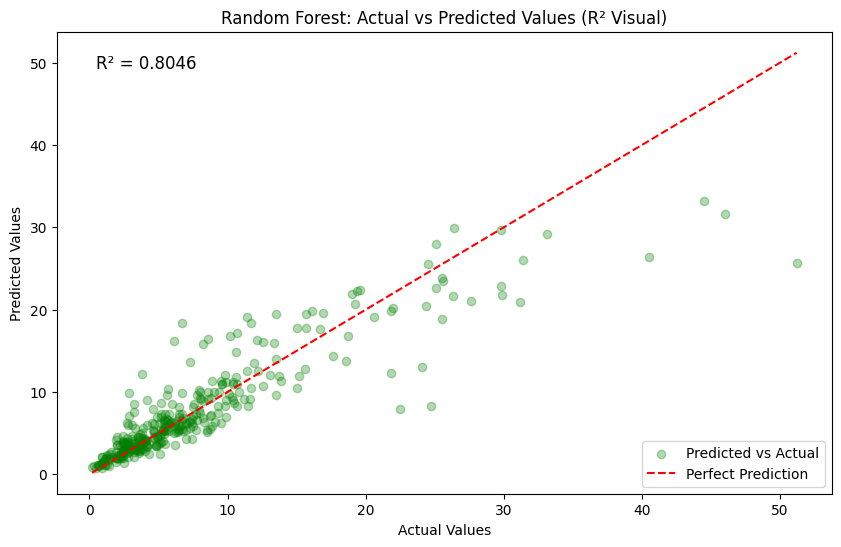

In [83]:
# Plot for Random Forest
plt.figure(figsize=(10, 6))
plt.scatter(results_df_rf_test['Actual'], results_df_rf_test['Predicted_RF'], color='green', alpha=0.3, label='Predicted vs Actual')

# Add a line representing perfect prediction
perfect_line = np.linspace(min(results_df_rf_test['Actual']), max(results_df_rf_test['Actual']), 100)
plt.plot(perfect_line, perfect_line, color='red', linestyle='--', label='Perfect Prediction')

# Add labels and title
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Random Forest: Actual vs Predicted Values (R² Visual)')
plt.legend()

# Calculate and display the R-squared value on the plot
r2 = r2_score(results_df_rf_test['Actual'], results_df_rf_test['Predicted_RF'])
plt.text(0.05, 0.95, f'R² = {r2:.4f}', transform=plt.gca().transAxes, fontsize=12, verticalalignment='top')

# Show the plot
plt.show()
